<a href="https://colab.research.google.com/github/MekhzZ/opencv_bootcamp_exercise/blob/main/10_Object_Tracking.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# improting libraries

import os
import sys
import cv2
import numpy as np
import matplotlib.pyplot as plt

from zipfile import ZipFile
from urllib.request import urlretrieve

from IPython.display import HTML
from matplotlib.animation import FuncAnimation

from IPython.display import YouTubeVideo, display, HTML
from base64 import b64encode

%matplotlib inline

In [ ]:
def download_and_unzip(url, save_path):
    print(f"Downloading and extracting assests....", end="")

    # Downloading zip file using urllib package.
    urlretrieve(url, save_path)

    try:
        # Extracting zip file using the zipfile package.
        with ZipFile(save_path) as z:
            # Extract ZIP file contents in the same directory.
            z.extractall(os.path.split(save_path)[0])

        print("Done")

    except Exception as e:
        print(f"Error: {e}")


URL = r"https://www.dropbox.com/s/ld535c8e0vueq6x/opencv_bootcamp_assets_NB11.zip?dl=1"

asset_zip_path = os.path.join(os.getcwd(), f"opencv_bootcamp_assets_NB11.zip")

# Download if assest ZIP does not exists.
if not os.path.exists(asset_zip_path):
    download_and_unzip(URL, asset_zip_path)

In [ ]:
video_input_file_name = "race_car.mp4"


def drawRectangle(frame, bbox):
    p1 = (int(bbox[0]), int(bbox[1]))
    p2 = (int(bbox[0] + bbox[2]), int(bbox[1] + bbox[3]))
    cv2.rectangle(frame, p1, p2, (255, 0, 0), 2, 1)


def displayRectangle(frame, bbox):
    plt.figure(figsize=(20, 10))
    frameCopy = frame.copy()
    drawRectangle(frameCopy, bbox)
    frameCopy = cv2.cvtColor(frameCopy, cv2.COLOR_RGB2BGR)
    plt.imshow(frameCopy)
    plt.axis("off")


def drawText(frame, txt, location, color=(50, 170, 50)):
    cv2.putText(frame, txt, location, cv2.FONT_HERSHEY_SIMPLEX, 1, color, 3)

## KCF Algorithm implementation

In [ ]:
# Read video
video = cv2.VideoCapture(video_input_file_name)
ok, frame = video.read()

# Exit if video not opened
if not video.isOpened():
    print("Could not open video")
    sys.exit()
else:
    width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))

video_output_file_name = "race_car-" + "KCF" + ".mp4"
video_out = cv2.VideoWriter(video_output_file_name, cv2.VideoWriter_fourcc(*"XVID"), 10, (width, height))

video_output_file_name

'race_car-KCF.mp4'

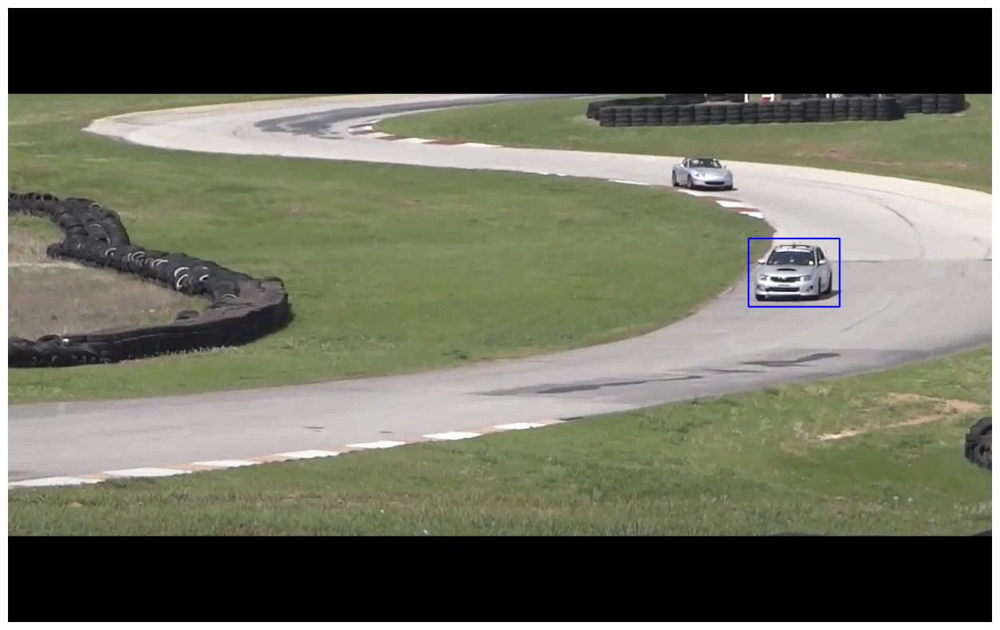

In [ ]:
bbox = (1300, 405, 160, 120)
displayRectangle(frame, bbox)

In [ ]:
tracker = cv2.legacy.TrackerKCF_create()


In [ ]:
ok = tracker.init(frame,bbox)

In [ ]:
while True:
    ok, frame = video.read()

    if not ok:
        break

    # Start timer
    timer = cv2.getTickCount()

    # Update tracker
    ok, bbox = tracker.update(frame)

    # Calculate Frames per second (FPS)
    fps = cv2.getTickFrequency() / (cv2.getTickCount() - timer)

    # Draw bounding box
    if ok:
        drawRectangle(frame, bbox)
    else:
        drawText(frame, "Tracking failure detected", (80, 140), (0, 0, 255))

    # Display Info
    drawText(frame, 'KCF' + " Tracker", (80, 60))
    drawText(frame, "FPS : " + str(int(fps)), (80, 100))

    # Write frame to video
    video_out.write(frame)

video.release()
video_out.release()

In [ ]:
# Installing ffmpeg
!apt-get -qq install ffmpeg

# Change video encoding of mp4 file from XVID to h264
!ffmpeg -y -i {video_output_file_name} -c:v libx264 $"race_car_track_x264.mp4"  -hide_banner -loglevel error

In [ ]:
mp4 = open("/content/race_car_track_x264.mp4", "rb").read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""<video width=1024 controls><source src="{data_url}" type="video/mp4"></video>""")


KCF (Kernelized Correlation Filter) is a fast and accurate algorithm for tracking objects in videos. It's like having a smart detective that can follow a target even when it moves, changes appearance, or is partially hidden.


---



**How KCF Works:**

Learning the Target:

- In the first frame, KCF focuses on the object you want to track (the target).
- It analyzes the target's features, like edges, colors, and textures, to create a "filter" or template. This filter acts like a fingerprint of the target.

**Searching for the Target:**

- In subsequent frames, KCF searches for the target in a small area around its last known location.
- It compares the filter with different parts of the search area using a mathematical operation called correlation.
- Correlation measures how similar the filter is to each part of the search area.
Finding the Best Match:

- The area where the filter matches best (highest correlation) is where KCF thinks the target is now.
It marks this location with a bounding box to show the target's position.


**Adapting to Changes:**

- KCF is smart enough to adapt to changes in the target's appearance or lighting conditions.
- It updates the filter over time to keep track of the target more effectively.

simply, in training phase:
- first frame with imageselected or bounded with rectangle or circle as target patch
- feature like Histogram of Oriented Gradients(HOG) is extracted from our target patch which detects the edges and intensities of pixels,
- correlation filter is feeded with HOG of target patch in circular shifted patches.

## GOTURN Algorithm implementation

In [ ]:
# Read video
video = cv2.VideoCapture(video_input_file_name)
ok, frame = video.read()

# Exit if video not opened
if not video.isOpened():
    print("Could not open video")
    sys.exit()
else:
    width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))

video_output_file_name = "race_car-" + "GOTURN" + ".mp4"
video_out = cv2.VideoWriter(video_output_file_name, cv2.VideoWriter_fourcc(*"XVID"), 10, (width, height))

video_output_file_name

'race_car-GOTURN.mp4'

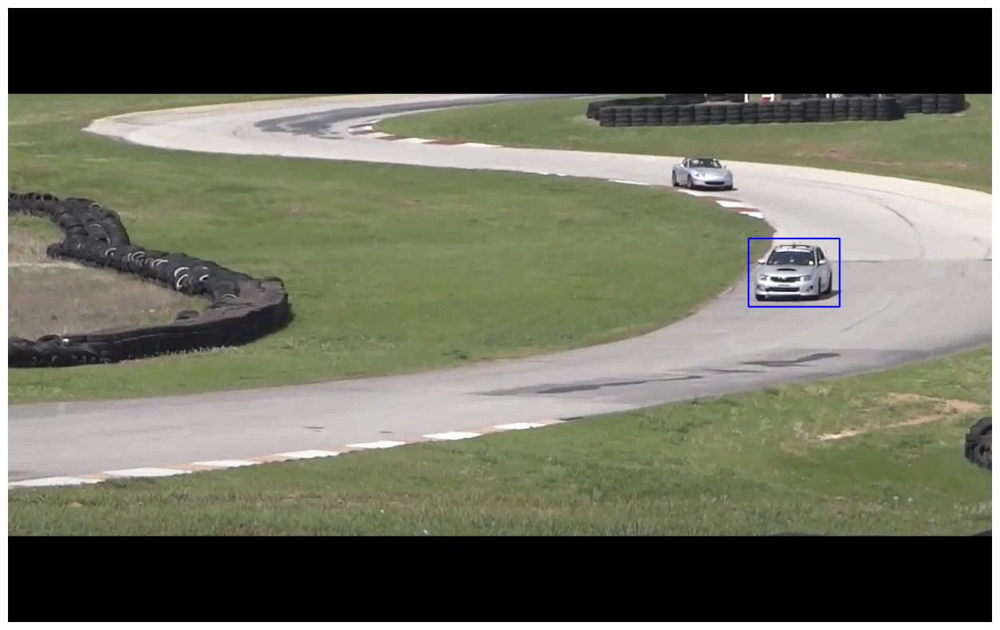

In [ ]:
bbox = (1300, 405, 160, 120)
displayRectangle(frame, bbox)

In [ ]:
tracker_goturn = cv2.TrackerGOTURN_create()

In [ ]:
ok = tracker_goturn.init(frame, bbox)

In [ ]:
while True:
  ok, frame = video.read()

  if not ok:
    break

  timer = cv2.getTickCount()

  ok, bbox = tracker_goturn.update(frame)

  fps = cv2.getTickFrequency() / (cv2.getTickCount() - timer)

  if ok:
    drawRectangle(frame, bbox)
  else:
    drawText(frame, "Tracking failure detected", (80, 140), (0, 0, 255))

  drawText(frame, 'GOTURN' + " Tracker", (80, 60))
  drawText(frame, "FPS : " + str(int(fps)), (80, 100))

  video_out.write(frame)

In [ ]:
video_out.release()
video.release()

In [ ]:


# Change video encoding of mp4 file from XVID to h264
!ffmpeg -y -i {video_output_file_name} -c:v libx264 $"race_car_GOTURN_x264.mp4"  -hide_banner -loglevel error

In [ ]:
mp4 = open("/content/race_car_GOTURN_x264.mp4", "rb").read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""<video width=1024 controls><source src="{data_url}" type="video/mp4"></video>""")

GOTURN (Generic Object Tracking Using Regression Networks) is a deep learning-based tracking algorithm. It's known for its speed and robustness in tracking objects across video frames.

**How GOTURN Works:**

- Training: GOTURN is trained on a large dataset of videos with labeled objects. During training, it learns to predict the location of an object in the next frame based on its location in the current frame and the appearance of the object and its surrounding region.

- Tracking: When used for tracking, GOTURN takes the current frame and the bounding box of the object as input. It then uses its trained neural network to predict the bounding box of the object in the next frame. This process is repeated for each subsequent frame in the video, effectively tracking the object's movement.

## Comparing GOTURN vs KCF

- as KCF is of simple algorithm which correlates the HOG feature extracted from images in circular shifts but GOTURN is already a pretrained model with large dataset using CNN , which is supposed to track objects once the inputs are delivered by user

---



**why GOTURN outperforms KCF?**

- GOTURN: The CNN's ability to learn generalizable features makes GOTURN more adaptable to new and unseen objects or scenarios. It can transfer its knowledge from the training data to new tracking tasks, leading to improved performance.

- KCF: KCF's performance is more dependent on the specific object and scenario it was trained on. It might not generalize as well to new objects or scenarios, requiring retraining or parameter adjustments.


---

proof that GOTURN's accuracy is higher than KCF .

- you can go through ["A Comparative Analysis of Object Tracking Algorithms" by Wu et al](https://www.spiedigitallibrary.org/conference-proceedings-of-spie/8138/81381A/An-experimental-comparison-of-online-object-tracking-algorithms/10.1117/12.895965.full)

- ["Learning to Track at 100 FPS with Deep Regression Networks,"](https://www.researchgate.net/publication/301875917_Learning_to_Track_at_100_FPS_with_Deep_Regression_Networks)